In [1]:
from scipy.io import wavfile
import torch
from model_definitions import LeNet, VGG16, Resnet
import numpy as np
from ConvertDataset import get_frames, window_Hamming, get_spectrogram, getFilters
import matplotlib.pyplot as plt
from scipy.fftpack import dct
import numpy.fft as fft
import os
from skimage.io import imread
import numpy as np
from sklearn.preprocessing import StandardScaler
import json
import IPython
import random
from transformers import ASTForAudioClassification, ASTFeatureExtractor

k:\Music Recommender\myenv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path_to_experimental_file = "./Experimental Data/friday-thrash-metal-instrumental.wav"
IPython.display.Audio(path_to_experimental_file)

In [3]:
sr, data = wavfile.read(path_to_experimental_file)
duration = 30 - 0.025
assert sr == 22050
sample_num = int(sr*duration)
if len(data) < 2 * sample_num:
    raise Exception("Audio too short! 1 minute or more required.")

sections = [data[i:i+sample_num] for i in range(0, len(data), sample_num)]
last_pad_len = sample_num - len(sections[-1])
last_empty_ratio = 0.0
if last_pad_len < sample_num:
    sections[-1] = np.pad(sections[-1], (0, last_pad_len), mode="constant")
    last_empty_ratio = last_pad_len / sample_num
print(len(sections[0]), len(sections[1]), len(sections[-1]))
sections_count = len(sections)
print(sections_count)
modifier_first, modifier_last = 1.0, 1.0
if len(sections) > 2:
    modifier_first, modifier_last = 0.75, 0.75

660948 660948 660948
8


In [4]:
melSpectrograms, mfccs = [], []
for data in sections:
    preemp = 0.66
    preemp_data = np.append(data[0], data[1:] - preemp * data[:-1])

    framed_data = get_frames(preemp_data, sr, wlen=0.025, wstep=0.010)
    flen = framed_data.shape[1]
    filter = window_Hamming(flen)
    windowed_data = framed_data * filter

    specter = np.abs(fft.rfft(windowed_data))
    spectrogram = get_spectrogram(specter)
    filterMatrix = getFilters()
    normFilterMatrix = filterMatrix.T / filterMatrix.sum(axis=1)
    melSpectrogram = np.transpose(normFilterMatrix).dot(np.transpose(spectrogram))
    numToKeep = 16
    mfcc = dct(melSpectrogram.T, type=2, axis=1, norm='ortho')[:, : numToKeep]

    melSpectrograms.append(melSpectrogram)
    mfccs.append(mfcc.T)

In [5]:
melSpectrogram = np.concatenate(melSpectrograms)

(16, 3004)


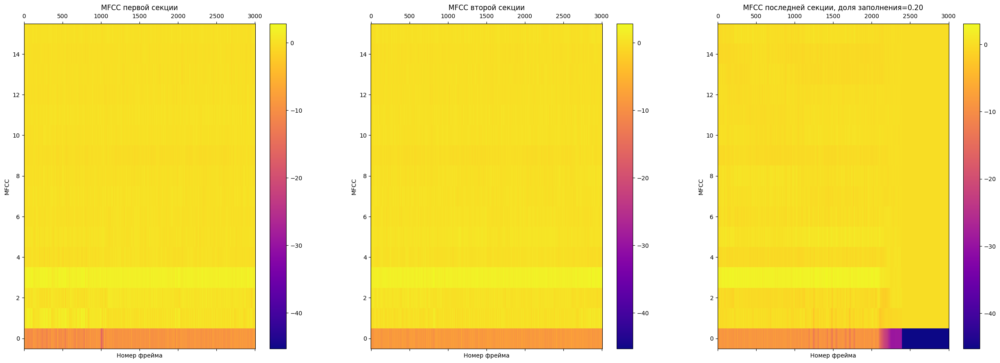

In [6]:
fig, ax = plt.subplots(1, 3, figsize=(30, 10))
ax1 = ax[0].matshow(mfccs[0], interpolation="nearest", aspect="auto", cmap=plt.cm.plasma, origin="lower")
ax2 = ax[1].matshow(mfccs[1], interpolation="nearest", aspect="auto", cmap=plt.cm.plasma, origin="lower")
ax3 = ax[2].matshow(mfccs[-1], interpolation="nearest", aspect="auto", cmap=plt.cm.plasma, origin="lower")
ax[0].set_xlabel('Номер фрейма')
ax[0].set_ylabel('MFCC')
ax[0].set_title("MFCC первой секции")
ax[1].set_xlabel('Номер фрейма')
ax[1].set_ylabel('MFCC')
ax[1].set_title("MFCC второй секции")
ax[2].set_xlabel('Номер фрейма')
ax[2].set_ylabel('MFCC')
ax[2].set_title(f"MFCC последней секции, доля заполнения={last_empty_ratio:.2f}")
fig.colorbar(ax1)
fig.colorbar(ax2)
fig.colorbar(ax3)
print(mfccs[0].shape)
plt.show()

In [7]:
mfccs.pop() # убираем mfcc последней секции

array([[-8.74380906e+00, -8.91146758e+00, -8.66869144e+00, ...,
        -4.52548340e+01, -4.52548340e+01, -4.52548340e+01],
       [-3.27878921e-01, -1.22764424e-01, -2.76625332e-02, ...,
        -4.88066738e-16, -4.88066738e-16, -4.88066738e-16],
       [-1.99040300e-01, -1.58557564e-01, -1.06736639e-01, ...,
         1.10697111e-18,  1.10697111e-18,  1.10697111e-18],
       ...,
       [-3.96936054e-02,  2.65183011e-01,  1.13325958e-01, ...,
        -6.66942144e-16, -6.66942144e-16, -6.66942144e-16],
       [-4.74994945e-01, -5.85763746e-01, -4.45248955e-01, ...,
         4.05587059e-16,  4.05587059e-16,  4.05587059e-16],
       [-2.75501502e-01, -3.31191141e-01, -1.78541143e-01, ...,
         4.24706809e-16,  4.24706809e-16,  4.24706809e-16]])

In [8]:
from app_utils import classify, recommend, AST_recommend

In [9]:
label_map = None
with open("label_map.json", "r") as f:
    label_map = json.load(f)
inv_label_map = {v: k for k, v in label_map.items()}

In [10]:
LNProbs, LNpredict, LNtop3 = classify(mfccs, "LeNet", min_confidence=0.2, mode="mfcc", debug=True)

LN_predicted_label = inv_label_map[LNpredict]
print(f"Predicted label with LeNet: {LN_predicted_label}")

all_recommendations = []
top3_labels = [inv_label_map[label] for label in LNtop3]
for rank, label in enumerate(top3_labels, 1):
    print(f"Getting recommendations for Top-{rank} label: {label}\n")
    recommendations = recommend(mfccs, label, mode="mfcc", top_n=3, debug=True)
    all_recommendations.append((label, recommendations))

gi = 0
for label, recs in all_recommendations:
    for _, (audio_path, distance) in enumerate(recs):
        print(f"rec №{gi+1}. Audio: {audio_path}, Distance: {distance:.4f}")
        gi += 1

Top-3 predicted classes: [7, 3, 2]
Final predicted class: 7
Predicted label with LeNet: pop
Getting recommendations for Top-1 label: pop

Getting recommendations for Top-2 label: disco

Getting recommendations for Top-3 label: country

rec №1. Audio: ./Dataset/genres/pop\pop.00064.wav, Distance: 0.9645
rec №2. Audio: ./Dataset/genres/pop\pop.00001.wav, Distance: 0.9650
rec №3. Audio: ./Dataset/genres/pop\pop.00058.wav, Distance: 0.9706
rec №4. Audio: ./Dataset/genres/disco\disco.00018.wav, Distance: 0.9737
rec №5. Audio: ./Dataset/genres/disco\disco.00043.wav, Distance: 0.9757
rec №6. Audio: ./Dataset/genres/disco\disco.00084.wav, Distance: 0.9759
rec №7. Audio: ./Dataset/genres/country\country.00009.wav, Distance: 0.9757
rec №8. Audio: ./Dataset/genres/country\country.00013.wav, Distance: 0.9763
rec №9. Audio: ./Dataset/genres/country\country.00037.wav, Distance: 0.9802


In [11]:
VGGProbs, VGGpredict, VGGtop3 = classify(mfccs, "VGG", min_confidence=0.2, mode="mfcc", debug=True)

VGG_predicted_label = inv_label_map[VGGpredict]
print(f"Predicted label with VGG: {VGG_predicted_label}")

all_recommendations = []
top3_labels = [inv_label_map[label] for label in VGGtop3]
for rank, label in enumerate(top3_labels, 1):
    print(f"Getting recommendations for Top-{rank} label: {label}\n")
    recommendations = recommend(mfccs, label, mode="mfcc", top_n=3, debug=True)
    all_recommendations.append((label, recommendations))

gi = 0
for label, recs in all_recommendations:
    for _, (audio_path, distance) in enumerate(recs):
        print(f"rec №{gi+1}. Audio: {audio_path}, Distance: {distance:.4f}")
        gi += 1

Top-3 predicted classes: [9, 5, 3]
Final predicted class: 9
Predicted label with VGG: rock
Getting recommendations for Top-1 label: rock

Getting recommendations for Top-2 label: jazz

Getting recommendations for Top-3 label: disco

rec №1. Audio: ./Dataset/genres/rock\rock.00052.wav, Distance: 0.9688
rec №2. Audio: ./Dataset/genres/rock\rock.00097.wav, Distance: 0.9778
rec №3. Audio: ./Dataset/genres/rock\rock.00063.wav, Distance: 0.9783
rec №4. Audio: ./Dataset/genres/jazz\jazz.00063.wav, Distance: 0.9802
rec №5. Audio: ./Dataset/genres/jazz\jazz.00085.wav, Distance: 0.9841
rec №6. Audio: ./Dataset/genres/jazz\jazz.00078.wav, Distance: 0.9848
rec №7. Audio: ./Dataset/genres/disco\disco.00045.wav, Distance: 0.9682
rec №8. Audio: ./Dataset/genres/disco\disco.00026.wav, Distance: 0.9683
rec №9. Audio: ./Dataset/genres/disco\disco.00028.wav, Distance: 0.9743


In [12]:
ResnetProbs, Resnetpredict, Resnettop3 = classify(mfccs, "Resnet", min_confidence=0.2, mode="mfcc", debug=True)

Resnet_predicted_label = inv_label_map[Resnetpredict]
print(f"Predicted label with Resnet: {Resnet_predicted_label}")

all_recommendations = []
top3_labels = [inv_label_map[label] for label in Resnettop3]
for rank, label in enumerate(top3_labels, 1):
    print(f"Getting recommendations for Top-{rank} label: {label}\n")
    recommendations = recommend(mfccs, label, mode="mfcc", top_n=3, debug=True)
    all_recommendations.append((label, recommendations))

gi = 0
for label, recs in all_recommendations:
    for _, (audio_path, distance) in enumerate(recs):
        print(f"rec №{gi+1}. Audio: {audio_path}, Distance: {distance:.4f}")
        gi += 1

Top-3 predicted classes: [4, 3, 5]
Final predicted class: 4
Predicted label with Resnet: hiphop
Getting recommendations for Top-1 label: hiphop

Getting recommendations for Top-2 label: disco

Getting recommendations for Top-3 label: jazz

rec №1. Audio: ./Dataset/genres/hiphop\hiphop.00033.wav, Distance: 0.9666
rec №2. Audio: ./Dataset/genres/hiphop\hiphop.00005.wav, Distance: 0.9756
rec №3. Audio: ./Dataset/genres/hiphop\hiphop.00042.wav, Distance: 0.9770
rec №4. Audio: ./Dataset/genres/disco\disco.00009.wav, Distance: 0.9720
rec №5. Audio: ./Dataset/genres/disco\disco.00018.wav, Distance: 0.9737
rec №6. Audio: ./Dataset/genres/disco\disco.00028.wav, Distance: 0.9743
rec №7. Audio: ./Dataset/genres/jazz\jazz.00010.wav, Distance: 0.9836
rec №8. Audio: ./Dataset/genres/jazz\jazz.00085.wav, Distance: 0.9841
rec №9. Audio: ./Dataset/genres/jazz\jazz.00078.wav, Distance: 0.9848


In [13]:
import librosa

model = ASTForAudioClassification.from_pretrained("./saved_ast_model")
feature_extractor = ASTFeatureExtractor.from_pretrained("./saved_ast_model")

model.eval()

sr, audio_input = wavfile.read(path_to_experimental_file)
audio_input = librosa.resample(audio_input.astype(float), orig_sr=sr, target_sr=feature_extractor.sampling_rate)
sr = feature_extractor.sampling_rate

inputs = feature_extractor(audio_input, sampling_rate=sr, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)
    logits = outputs.logits

probs = torch.softmax(logits, dim=-1)
top3_probs, top3_ids = torch.topk(probs, k=3, dim=-1)

top3_probs = top3_probs.squeeze().tolist()
top3_ids = top3_ids.squeeze().tolist()

top3_labels = [inv_label_map[i] for i in top3_ids]

for label, prob in zip(top3_labels, top3_probs):
    print(f"{label}: {prob:.4f}")

pop: 0.3825
classical: 0.1457
metal: 0.1075


In [14]:
AST_probs, AST_predicted_label, AST_top3_labels = top3_probs, top3_ids[0], top3_ids
print(f"Predicted label with AST: {AST_predicted_label}")

all_recommendations = []
for rank, label in enumerate(AST_top3_labels, 1):
    label_name = inv_label_map[label]
    print(f"Getting recommendations for Top-{rank} label: {label_name}\n")
    recommendations = AST_recommend(audio_input, sr, label_name, top_n=3, debug=True)
    all_recommendations.append((label_name, recommendations))

gi = 0
for label, recs in all_recommendations:
    for _, (audio_path, distance) in enumerate(recs):
        print(f"rec №{gi+1}. Audio: {audio_path}, Distance: {distance:.4f}")
        gi += 1

Predicted label with AST: 7
Getting recommendations for Top-1 label: pop

Getting recommendations for Top-2 label: classical

Getting recommendations for Top-3 label: metal

rec №1. Audio: ./Dataset/genres/pop\pop.00037.wav, Distance: 0.1554
rec №2. Audio: ./Dataset/genres/pop\pop.00035.wav, Distance: 0.1581
rec №3. Audio: ./Dataset/genres/pop\pop.00088.wav, Distance: 0.2001
rec №4. Audio: ./Dataset/genres/classical\classical.00051.wav, Distance: 0.8286
rec №5. Audio: ./Dataset/genres/classical\classical.00049.wav, Distance: 0.9922
rec №6. Audio: ./Dataset/genres/classical\classical.00052.wav, Distance: 1.0786
rec №7. Audio: ./Dataset/genres/metal\metal.00016.wav, Distance: 0.1676
rec №8. Audio: ./Dataset/genres/metal\metal.00035.wav, Distance: 0.1908
rec №9. Audio: ./Dataset/genres/metal\metal.00078.wav, Distance: 0.2167
